<a href="https://colab.research.google.com/github/kigit2017/Houe-price-prediction/blob/main/SeoulBikes2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Project Title
%%html
<marquee stle = 'width:100%; color:blue;'><b> <h1 style = "color:SeaGreen; font-family : verdana;"> Seoul Bike Sharing Demand Prediction (Suoervised ML)<h1></b></marquee>

# Data Decription
The datset contains weather information (Temperarure, Humidity, Windspeed, Dewpoint, Solar radioation,Snowfall, Rainfall)
The number of bikes rented per hour and date informations are available.

## Attribute Information
- Date : year-month-day
- Rented Bike Count - Count of Bikes rented at each hour
- Hour - Hour of the day
- Temperature - Temperarure in Celcius
- Humidity - %
- Windspeed - m/s
- Visibility - 10m
- Dew Point temperarure - Celsius
- Solar Radiation - MJ/m^2
- Rainfall - mm
- Snowfall - cm
- Seasons - Winter, Spring, Summer, Aututmn
- Holiday - Holiday/no Holiday
- Functional Day - No FUnc(No Functional Hours), Fun(Functional Hours)

## Project Flow Control -
- Loading data and Diagnosing the data
- Data filtering
- EDA of Row data to understand inside correlations
- Feature Selection - We are not use much because of limited features in our data
- Model Building
- Model training
- Model Evaluation and hyper parameters training

# 1. Import Libraries and Data

In [4]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import preprocessing, linear_model
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import r2_score, mean_squared_error, accuracy_score
from sklearn.linear_model import LinearRegression

## 1.1 Data Loading

In [5]:
data = pd.read_csv('/content/SeoulBikeData.csv')

In [6]:
%load_ext google.colab.data_table
data

,Date,Rented Bike Count,Hour,Temperature(C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,30/11/2018,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,30/11/2018,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes


## 1.1.2 First check the duplicate entries
- Duplicate entries given wrong prediction and also consume unnecessory stroage and consuming time during testing and taining data


In [7]:
print(len(data[data.duplicated()]))

0


- Not Found any duplicated entries inside data

## 1.2 Diagnosing the data

In [23]:
# Custom functions for finding, Dtype, Unique values and null values
def datainfo():
  temp_ps = pd.DataFrame(index = data.columns)
  temp_ps['DataType'] = data.dtypes
  temp_ps['Non-null_values'] = data.count()
  temp_ps['Unique_values'] = data.nunique()
  temp_ps['NaN_Values'] = data.isnull().sum()
  temp_ps['NaN_Values_percentage'] = (temp_ps['NaN_Values']/len(data))*100
  return temp_ps

In [24]:
print(datainfo())

                         DataType  Non-null_values  Unique_values  NaN_Values  \
Date                       object             8760            365           0   
Rented Bike Count           int64             8760           2166           0   
Hour                        int64             8760             24           0   
Temperature(C)            float64             8760            546           0   
Humidity(%)                 int64             8760             90           0   
Wind speed (m/s)          float64             8760             65           0   
Visibility (10m)            int64             8760           1789           0   
Dew point temperature(C)  float64             8760            556           0   
Solar Radiation (MJ/m2)   float64             8760            345           0   
Rainfall(mm)              float64             8760             61           0   
Snowfall (cm)             float64             8760             51           0   
Seasons                    o

### Finding details of the data
- 1. There are 14 features with 8760 rows of data.
- 2. There are 4 categorical columns and 10 numerical columns. Columns 'Date','Seasons','Functioning Day',  are object Data Type
- 3. Columns 'Rented Bike Count','Hour','Humidity','and Visibility(10m) are of int 64 type
- 4. Column 'Temperature (degree celcius), wind speed (m/s), Dew point temperature (degreee celcius), Solar Radiation(MJ/m^2), Rainfall(mm) and Snowfall(cm) are of float64 numerical data type.
- 5.Not any nul values present in any column
6. Unique count: Seasong -4, Holiday-2, Functioning Day-2


In [26]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Rented Bike Count,8760.0,704.602055,644.997468,0.0,191.00,504.50,1065.25,3556.00
Hour,8760.0,11.500000,6.922582,0.0,5.75,11.50,17.25,23.00
Temperature(C),8760.0,12.882922,11.944825,-17.8,3.50,13.70,22.50,39.40
Humidity(%),8760.0,58.226256,20.362413,0.0,42.00,57.00,74.00,98.00
Wind speed (m/s),8760.0,1.724909,1.036300,0.0,0.90,1.50,2.30,7.40
Visibility (10m),8760.0,1436.825799,608.298712,27.0,940.00,1698.00,2000.00,2000.00
Dew point temperature(C),8760.0,4.073813,13.060369,-30.6,-4.70,5.10,14.80,27.20
Solar Radiation (MJ/m2),8760.0,0.569111,0.868746,0.0,0.00,0.01,0.93,3.52
Rainfall(mm),8760.0,0.148687,1.128193,0.0,0.00,0.00,0.00,35.00
Snowfall (cm),8760.0,0.075068,0.436746,0.0,0.00,0.00,0.00,8.80


# 2. Data Filtering

## 2.1 Rented Bike days filtering

In [29]:
# for checking fucntioning and non functioning day,plot (hour VS Rented Bike COunt Graph)

def barplots(x,y,hue):
  plt.figure(figsize = (15,7))
  sns.set_palette('husl')
  sns.barplot(x = x,y = y,hue = hue, data=data)


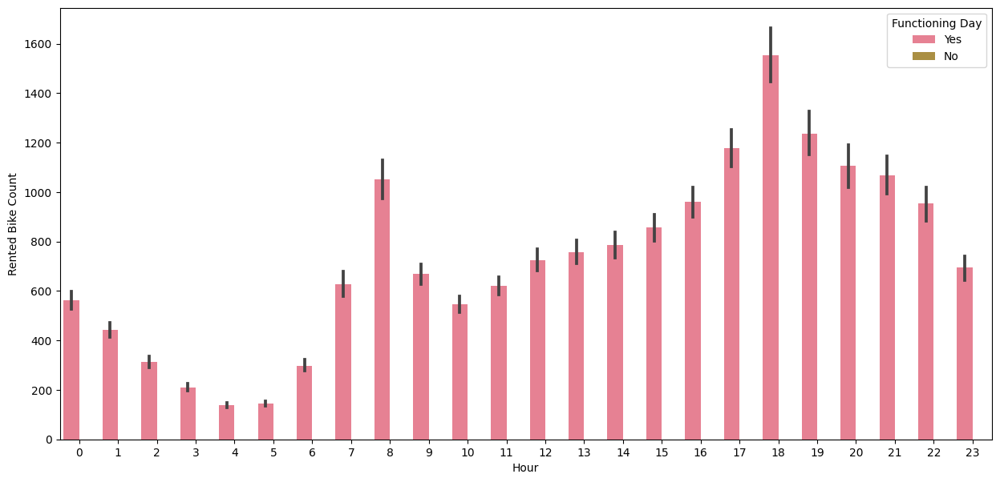

In [31]:
barplots('Hour','Rented Bike Count','Functioning Day')

In [33]:
# Grouping by functioning day and calculating the total Rented Bike Count
data.groupby('Functioning Day').sum()['Rented Bike Count'].sort_values(ascending = False).reset_index()

<ipython-input-33-e6facfbaa73d>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  data.groupby('Functioning Day').sum()['Rented Bike Count'].sort_values(ascending = False).reset_index()


,Functioning Day,Rented Bike Count
0,Yes,6172314
1,No,0


In [56]:
# we will removie non functioning day columns
df = data.drop(data[data['Functioning Day'] == 'No'].index)
df.shape

(8465, 14)

In [41]:
# Due to not unseful in fucntiong day remove the columns
df1 = df.drop(['Functioning Day'], axis = 1)

In [37]:
df1.shape

(8465, 13)

In [42]:
# We will sepearate Date, Month, year from the Date column
# 1st we will convert Date to datecolumn and extra different parts of the date

df1['Date'] = pd.to_datetime(df1['Date'])
df1['Date']

<ipython-input-42-622473c1a190>:4: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  df1['Date'] = pd.to_datetime(df1['Date'])


0      2017-01-12
1      2017-01-12
2      2017-01-12
3      2017-01-12
4      2017-01-12
          ...    
8755   2018-11-30
8756   2018-11-30
8757   2018-11-30
8758   2018-11-30
8759   2018-11-30
Name: Date, Length: 8465, dtype: datetime64[ns]

In [43]:
# seperate day, month, year
df1['Day'] = df1['Date'].dt.day
df1['Month'] = df1['Date'].dt.month
df1['Year'] = df1['Date'].dt.year

In [44]:
df1.head()

,Date,Rented Bike Count,Hour,Temperature(C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Day,Month,Year
0,2017-01-12,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,12,1,2017
1,2017-01-12,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,12,1,2017
2,2017-01-12,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,12,1,2017
3,2017-01-12,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,12,1,2017
4,2017-01-12,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,12,1,2017


In [45]:
# drop the date column after extracting the necessory information
df1.drop(columns = ['Date'], inplace = True)

In [46]:
df1.head()

,Rented Bike Count,Hour,Temperature(C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Day,Month,Year
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,12,1,2017
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,12,1,2017
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,12,1,2017
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,12,1,2017
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,12,1,2017


# 3.1 Exploratory Analysis and Visulization

Let's explore the data by visulizing the distribution of values in some columns of the dataset, and the relationship between "Rented Bike count" and other columns.


## 3.1 Checking Correlation of Data
Correlation is statistical measure that expresses the strength of the relationship between two variables.
The two main types of correlation : <b> positive and negative </b>


<ipython-input-49-a27931301cc7>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  data_corr = df1.corr()


<Axes: >

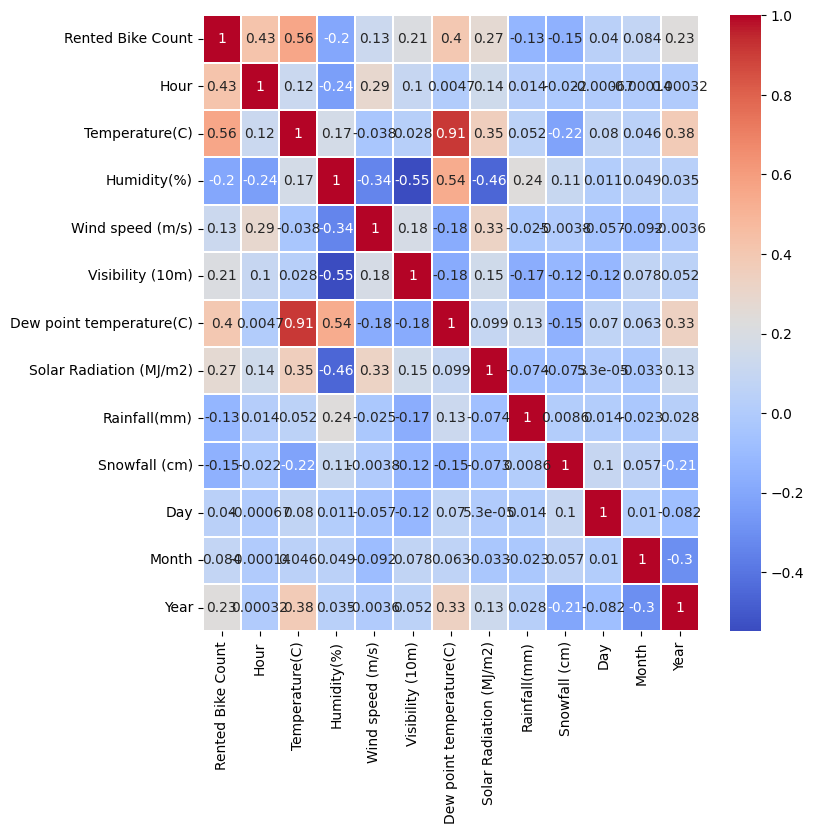

In [49]:
# corr()
data_corr = df1.corr()
plt.figure(figsize = (8,8))

sns.heatmap(data_corr, cmap = 'coolwarm', linewidths = 0.1, annot = True, linecolor = 'White')

In [50]:
df1.drop(columns = ['Dew point temperature(C)'], inplace = True)

In [51]:
df1.shape

(8465, 14)

In [52]:
df1.columns

Index(['Rented Bike Count', 'Hour', 'Temperature(C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Solar Radiation (MJ/m2)',
       'Rainfall(mm)', 'Snowfall (cm)', 'Seasons', 'Holiday', 'Day', 'Month',
       'Year'],
      dtype='object')

In [54]:
# seperating numerical and categorical data
numerical_features = [col for col in df1.columns if df1[col].dtype != 'O']
numerical_features

['Rented Bike Count',
 'Hour',
 'Temperature(C)',
 'Humidity(%)',
 'Wind speed (m/s)',
 'Visibility (10m)',
 'Solar Radiation (MJ/m2)',
 'Rainfall(mm)',
 'Snowfall (cm)',
 'Day',
 'Month',
 'Year']

In [55]:
num_data = df1[numerical_features]
num_data

,Rented Bike Count,Hour,Temperature(C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Day,Month,Year
0,254,0,-5.2,37,2.2,2000,0.0,0.0,0.0,12,1,2017
1,204,1,-5.5,38,0.8,2000,0.0,0.0,0.0,12,1,2017
2,173,2,-6.0,39,1.0,2000,0.0,0.0,0.0,12,1,2017
3,107,3,-6.2,40,0.9,2000,0.0,0.0,0.0,12,1,2017
4,78,4,-6.0,36,2.3,2000,0.0,0.0,0.0,12,1,2017
...,...,...,...,...,...,...,...,...,...,...,...,...
8755,1003,19,4.2,34,2.6,1894,0.0,0.0,0.0,30,11,2018
8756,764,20,3.4,37,2.3,2000,0.0,0.0,0.0,30,11,2018
8757,694,21,2.6,39,0.3,1968,0.0,0.0,0.0,30,11,2018
8758,712,22,2.1,41,1.0,1859,0.0,0.0,0.0,30,11,2018
